<a href="https://colab.research.google.com/github/weijiewang87/wei_jie_wang_bachelor_project/blob/main/model_training_colab_notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Install Dependencies

_(Remember to choose GPU in Runtime if not already selected. Runtime --> Change Runtime Type --> Hardware accelerator --> GPU)_

In [1]:
# clone this project's repository
!git clone https://github.com/weijiewang87/wei_jie_wang_bachelor_project

Cloning into 'wei_jie_wang_bachelor_project'...
remote: Enumerating objects: 153, done.
remote: Counting objects: 100% (153/153), done.
remote: Compressing objects: 100% (141/141), done.
remote: Total 153 (delta 24), reused 140 (delta 11), pack-reused 0
Receiving objects: 100% (153/153), 12.08 MiB | 29.25 MiB/s, done.
Resolving deltas: 100% (24/24), done.


In [2]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into 'yolov5'...
remote: Enumerating objects: 15661, done.
remote: Counting objects: 100% (268/268), done.
remote: Compressing objects: 100% (166/166), done.
remote: Total 15661 (delta 138), reused 176 (delta 102), pack-reused 15393
Receiving objects: 100% (15661/15661), 14.66 MiB | 22.60 MiB/s, done.
Resolving deltas: 100% (10662/10662), done.
/content/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [3]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 58.3 MB/s eta 0:00:00
Setup complete. Using torch 2.0.0+cu118 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15101MB, multi_processor_count=40)


# Download Correctly Formatted Custom Dataset 

Download the dataset from Roboflow, by using the "**YOLOv5 PyTorch**" export format.

In [4]:
!pip install -q roboflow

%cd /content/yolov5
###### Pointer Whole + 3 Bounding Boxes ####### (Version 2 - meter a & b)
from roboflow import Roboflow
rf = Roboflow(api_key="y7wJ4BHUe5kChKgmQbUD")
project = rf.workspace("itu-weijie-wang").project("whole-pointer-with-3-points")
dataset = project.version(2).download("yolov5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 kB 6.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.7 MB/s eta 0:00:00
/content/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Whole-Pointer-with-3-points-2 in yolov5pytorch:: 100%|██████████| 4332/4332 [00:01<00:00, 2489.90it/s]


In [5]:
# this is the YAML file Roboflow wrote for us that we're loading into this notebook with our data
%cat {dataset.location}/data.yaml

names:
- centerrotation
- pointerrotation
- scale-maxrotation
- scale-minrotation
nc: 4
roboflow:
  license: CC BY 4.0
  project: whole-pointer-with-3-points
  url: https://universe.roboflow.com/itu-weijie-wang/whole-pointer-with-3-points/dataset/2
  version: 2
  workspace: itu-weijie-wang
test: ../test/images
train: Whole-Pointer-with-3-points-2/train/images
val: Whole-Pointer-with-3-points-2/valid/images


# [Skipping Instruction] Train YOLOv5 model & Model Optimization
If you want to skip the training and quantization processes, follow these instructions:
1.   make directories --> /content/yolov5/runs/train/yolov5n_results/weights
2.   copy the trained models into the **weights** folder

Here are the models:
*   best.pt
*   quantization_dynamic.tflite
*   quantization_float16.tflite
*   quantization_16x8.tflite

Please run the cell below.

In [6]:
!mkdir -p /content/yolov5/runs/train/yolov5n_results/weights
!cp -r /content/wei_jie_wang_bachelor_project/trained_models/. /content/yolov5/runs/train/yolov5n_results/weights

# Train YOLOv5n model

Details of the arguments:
- **img:** define input image size
- **batch:** determine batch size
- **epochs:** define the number of training epochs. (Note: often, 3000+ are common here!)
- **data:** set the path to our yaml file
- **cfg:** specify our model configuration
- **weights:** specify a custom path to weights.
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

### Training from stracth

In [ ]:
# train yolov5n on custom data for 100 epochs
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --cfg ./models/yolov5n.yaml --weights '' --name yolov5n_results  --cache --seed 0

/content/yolov5
2023-05-14 09:53:48.185401: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-14 09:53:49.345892: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=./models/yolov5n.yaml, data=/content/yolov5/Whole-Pointer-with-3-points-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5n_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_per

### Training with pre-trained weights

In [52]:
# train yolov5s on custom data for 100 epochs
%%time
%cd /content/yolov5/
!python train.py --img 416 --batch 16 --epochs 100 --data {dataset.location}/data.yaml --weights yolov5n.pt --name yolov5n_results --cache --seed 0

/content/yolov5
2023-05-14 11:49:44.187332: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=yolov5n.pt, cfg=, data=/content/yolov5/Whole-Pointer-with-3-points-2/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=yolov5n_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: ⚠️ YOLOv5 is out of date by 94 commits. Use `git pull` or `git clone https://github.com/ultralytics/yolov5` to update.
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

hy

# Evaluate Custom YOLOv5 Detector Performance

If you skip the training process, but you still want to see the model's performance.    
Please run the cell below to copy the images to designated folder for visualization purposes.

In [7]:
!cp -r /content/wei_jie_wang_bachelor_project/training_images/. /content/yolov5/runs/train/yolov5n_results

### Visualizations of the losses, precision, and recall

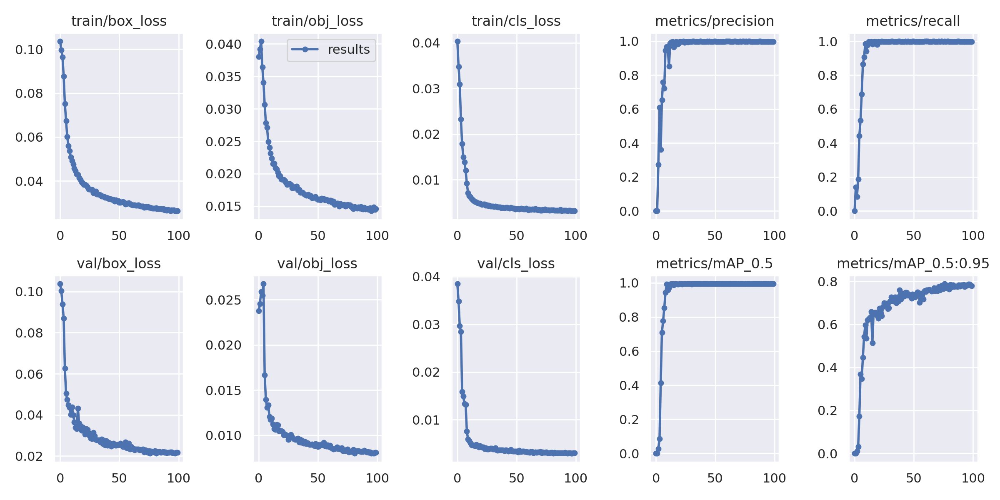

In [8]:
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5n_results/results.png', width=1000)  # view results.png

### Visualization of true validation data

True Validation Data:


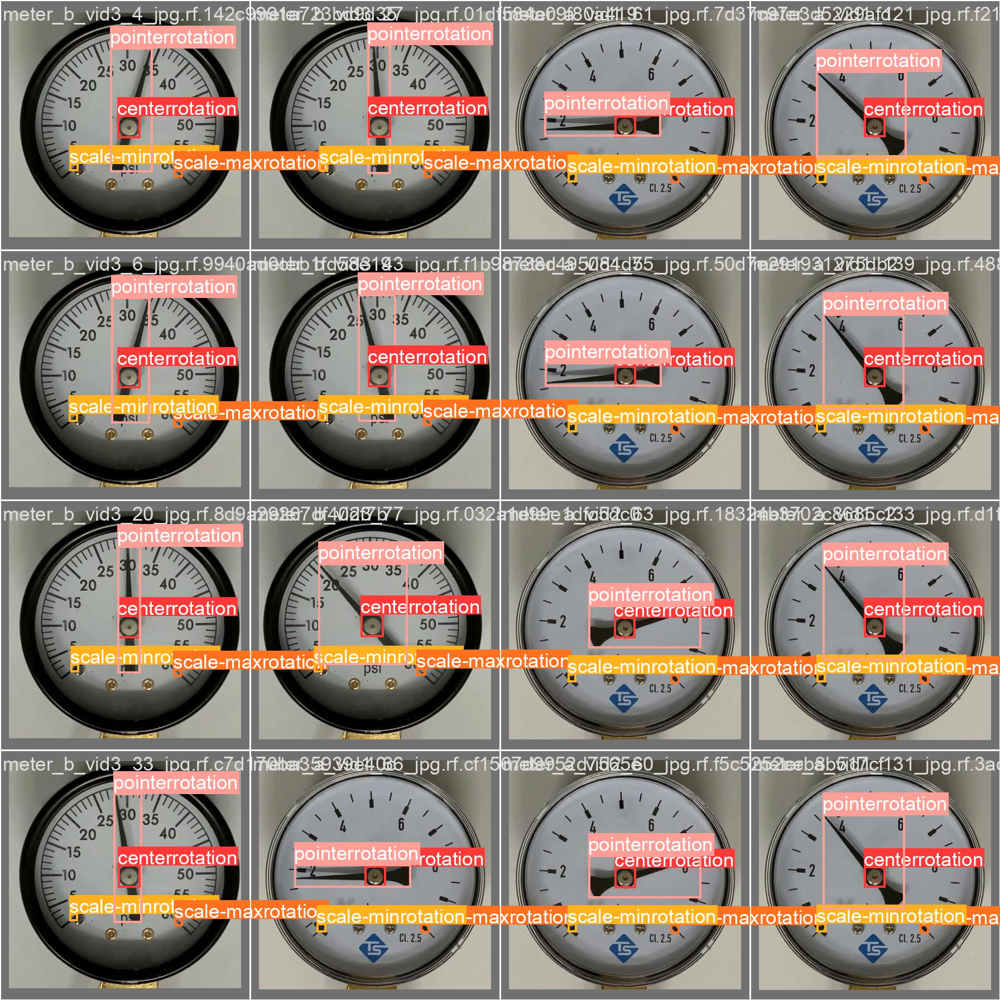

In [9]:
print("True Validation Data:")
Image(filename='/content/yolov5/runs/train/yolov5n_results/val_batch0_labels.jpg', width=900)

### Visualization of predicted validation data

Predicted Validation Data:


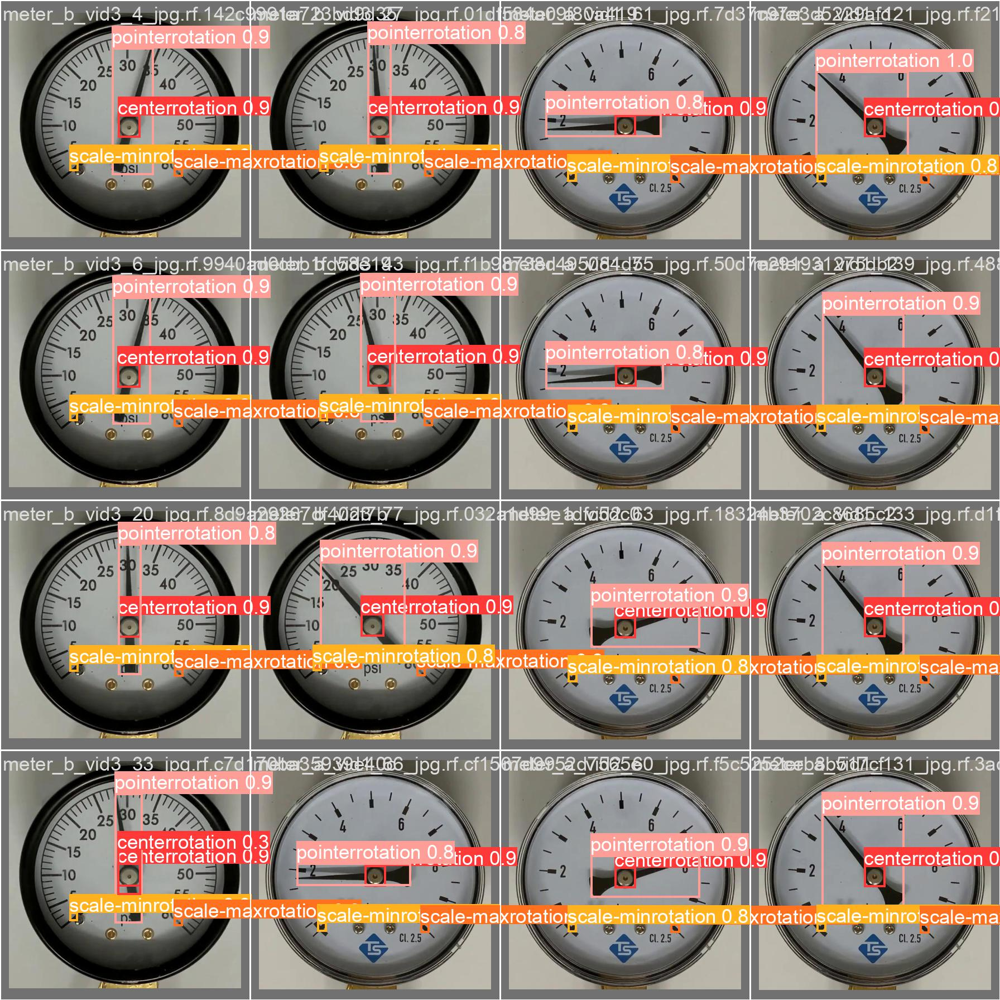

In [10]:
print("Predicted Validation Data:")
Image(filename='/content/yolov5/runs/train/yolov5n_results/val_batch0_pred.jpg', width=900)

### Confusion Matrix

Confusion Matrix:


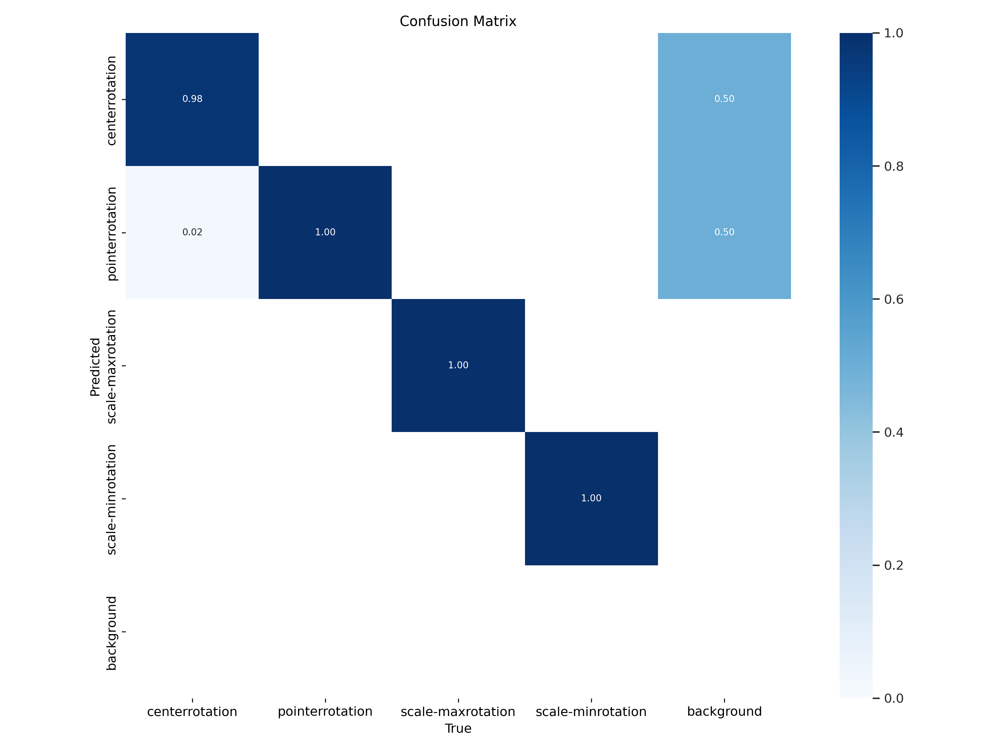

In [11]:
print("Confusion Matrix:")
Image(filename='/content/yolov5/runs/train/yolov5n_results/confusion_matrix.png', width=900)

# Model Optimization

### Convert Pytorch model to TensorFlow model

In [12]:
!python /content/yolov5/export.py --weights /content/yolov5/runs/train/yolov5n_results/weights/best.pt --include saved_model pb tflite

export: data=data/coco128.yaml, weights=['/content/yolov5/runs/train/yolov5n_results/weights/best.pt'], imgsz=[640, 640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['saved_model', 'pb', 'tflite']
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.11 torch-2.0.0+cu118 CPU

Fusing layers... 
YOLOv5n summary: 157 layers, 1764577 parameters, 0 gradients, 4.1 GFLOPs

PyTorch: starting from /content/yolov5/runs/train/yolov5n_results/weights/best.pt with output shape (1, 25200, 9) (3.6 MB)
2023-05-14 17:31:53.895795: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate co

### Quantization Instruction
https://www.tensorflow.org/lite/performance/post_training_quantization

In [13]:
import numpy as np
import tensorflow as tf
saved_model_dir = "/content/yolov5/runs/train/yolov5n_results/weights/best_saved_model"

### Dynamic Range Quantization 

In [14]:
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
converter.optimizations = [tf.lite.Optimize.DEFAULT] ### Dynamic Quantization

tflite_quant_model = converter.convert()

open("/content/yolov5/runs/train/yolov5n_results/weights/quantization_dynamic.tflite", "wb").write(tflite_quant_model)

1978616

### Float 16 Quantization

In [15]:
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

### Quantsize to float 16
converter.target_spec.supported_types = [tf.float16]

tflite_quant_model = converter.convert()

open("/content/yolov5/runs/train/yolov5n_results/weights/quantization_float16.tflite", "wb").write(tflite_quant_model)

3653276

### 16 x 8 Quantization

In [16]:
converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
converter.optimizations = [tf.lite.Optimize.DEFAULT]

### Quantsize to 16-bit activations with 8-bit weights 
converter.target_spec.supported_ops = [tf.lite.OpsSet.EXPERIMENTAL_TFLITE_BUILTINS_ACTIVATIONS_INT16_WEIGHTS_INT8]

tflite_quant_model = converter.convert()

open("/content/yolov5/runs/train/yolov5n_results/weights/quantization_16x8.tflite", "wb").write(tflite_quant_model)

1978616

### 8 bits integer Quantization

In [17]:
#def representative_dataset():
#    for _ in range(100):
#      data = np.random.rand(1, 640, 640, 3)
#      yield [data.astype(np.float32)]

#representative_dataset = representative_dataset()

#converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
#converter.optimizations = [tf.lite.Optimize.DEFAULT]

#### These 4 lines are trying to make the file into 8 bits integer
#converter.representative_dataset = representative_dataset
#converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
#converter.inference_input_type = tf.int8  # or tf.uint8
#converter.inference_output_type = tf.int8  # or tf.uint8

#tflite_quant_model = converter.convert()

#open("/content/yolov5/runs/train/yolov5n_results/weights/quantization_integer8.tflite", "wb").write(tflite_quant_model)

# Run inference on trained models

Details of the arguments:
- **weights:** select specific trained weight
- **source:** select the source of data for prediciton
- **save-txt:** save the coordinates of the objects in txt files
- **save-conf** save the confidence of the predicted objects in the txt files

### Dynamic Quantization Model Prediction

In [18]:
!python detect.py --weights /content/yolov5/runs/train/yolov5n_results/weights/quantization_dynamic.tflite --source Whole-Pointer-with-3-points-2/test/images --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/yolov5n_results/weights/quantization_dynamic.tflite'], source=Whole-Pointer-with-3-points-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

2023-05-14 17:33:28.819246: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Loading /content/yolov5/runs/train/yolov5n_results/weights/quantization_dynamic.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/90 /content/yolov5/Whole-Pointer-with-3-points-2/test/images/

### Float 16 Quantization Model Prediction

In [19]:
!python detect.py --weights /content/yolov5/runs/train/yolov5n_results/weights/quantization_float16.tflite --source Whole-Pointer-with-3-points-2/test/images --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/yolov5n_results/weights/quantization_float16.tflite'], source=Whole-Pointer-with-3-points-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

2023-05-14 17:33:54.579610: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Loading /content/yolov5/runs/train/yolov5n_results/weights/quantization_float16.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/90 /content/yolov5/Whole-Pointer-with-3-points-2/test/images/

### 16x8 Quantization Model Prediction

In [20]:
!python detect.py --weights /content/yolov5/runs/train/yolov5n_results/weights/quantization_16x8.tflite --source Whole-Pointer-with-3-points-2/test/images --save-txt --save-conf

detect: weights=['/content/yolov5/runs/train/yolov5n_results/weights/quantization_16x8.tflite'], source=Whole-Pointer-with-3-points-2/test/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_conf=True, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-72-g064365d Python-3.10.11 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)

2023-05-14 17:34:15.043132: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Loading /content/yolov5/runs/train/yolov5n_results/weights/quantization_16x8.tflite for TensorFlow Lite inference...
INFO: Created TensorFlow Lite XNNPACK delegate for CPU.
image 1/90 /content/yolov5/Whole-Pointer-with-3-points-2/test/images/meter_

# Important functions for calculating the angle and value

In [21]:
import cv2
from google.colab.patches import cv2_imshow

def dots_on_image(center_x, center_y, pointer_x, pointer_y, image_path):
  # This function will plot 2 red dots on the image to show the 2 center points of the bounding boxes.
  # Please copy paste the import below to the top of your code.
  #import cv2
  #from google.colab.patches import cv2_imshow

  cv2_img = cv2.imread(image_path, cv2.IMREAD_COLOR)
  red = [0,0,255]
  new_img1 = cv2.circle(cv2_img, (int(center_x), int(center_y)), 5, red, -1)
  new_img2 = cv2.circle(cv2_img, (int(pointer_x), int(pointer_y)), 5, red, -1)

  cv2_imshow(new_img2)
  return None

def four_dots_on_image(center_x, center_y, pointer_x, pointer_y, min_x, min_y, max_x, max_y,image_path):
  # This function will plot 2 red dots on the image to show the 2 center points of the bounding boxes.
  # Please copy paste the import below to the top of your code.
  #import cv2
  #from google.colab.patches import cv2_imshow

  cv2_img = cv2.imread(image_path, cv2.IMREAD_COLOR)
  red = [0,0,255]
  new_img1 = cv2.circle(cv2_img, (int(center_x), int(center_y)), 5, red, -1)
  new_img2 = cv2.circle(cv2_img, (int(pointer_x), int(pointer_y)), 5, red, -1)
  new_img3 = cv2.circle(cv2_img, (int(min_x), int(min_y)), 5, red, -1)
  new_img4 = cv2.circle(cv2_img, (int(max_x), int(max_y)), 5, red, -1)

  cv2_imshow(new_img4)
  return None

def calculate_min_center_angle(min_x, min_y, pointer_x, pointer_y):
  import math
  dy = abs(pointer_y - min_y)
  dx = abs(pointer_x - min_x)
  theta = math.atan2(dx, dy) #dy, dx
  theta = math.degrees(theta)
  theta = round(theta)
  return theta

def calculate_max_center_angle(max_x, max_y, pointer_x, pointer_y):
  import math
  dy = abs(pointer_y - max_y)
  dx = abs(pointer_x - max_x)
  theta = math.atan2(dx, dy)
  theta = math.degrees(theta)
  theta = round(theta)
  return theta

def calculate_theta(center_x, center_y, pointer_x, pointer_y):
  # This function will calculate the theta between center point and the tip.
  # Please copy paste the import below to the top of your code.
  import math

  # Inspired by: https://blog.roboflow.com/read-analog-dials-computer-vision/

  dy = abs(pointer_y - center_y)
  dx = abs(pointer_x - center_x)
  theta = math.atan2(dy, dx)
  theta = math.degrees(theta)
  theta = round(theta)
  return theta

def find_position(center_x, center_y, pointer_x, pointer_y):
  if center_x == pointer_x and center_y > pointer_y:
    return "vertical_top"
  elif center_x < pointer_x and center_y == pointer_y:
    return "horizontal_right"
  elif center_x > pointer_x and center_y == pointer_y:
    return "horizontal_left"
  elif center_x < pointer_x and center_y > pointer_y:
    return "top_right"
  elif center_x > pointer_x and center_y > pointer_y:
    return "top_left"
  elif center_x < pointer_x and center_y < pointer_y:
    return "bottom_right"
  elif center_x > pointer_x and center_y < pointer_y:
    return "bottom_left"

def adjust_theta(theta, min_angle, position):
  buffer_angle = 90-min_angle 
  if position == "vertical_top":
    return 90 + buffer_angle #originally 45
  elif position == "horizontal_right":
    return 90 + 90 + buffer_angle
  elif position == "horizontal_left":
    return buffer_angle
  elif position == "top_right":
    return buffer_angle + 180 - theta
  elif position == "top_left":
    return theta + buffer_angle 
  elif position == "bottom_right":
    return buffer_angle + 180 + buffer_angle + theta #I think it is more correct to "add theta".
  elif position == "bottom_left":
    adjusted_theta = buffer_angle - theta
    if adjusted_theta <= 0:
      return 0
    else:
      return adjusted_theta

def map_theta_value(min, max, meter_degree, adjust_theta):
  ratio = adjust_theta / meter_degree
  value = (max - min) * ratio
  return value

# Run the predicted results from TensorFlow Lite models

### Sort the predicted images, predicted txt files, orginal images

In [22]:
# import required module
import os
# assign directory
directory = '/content/yolov5/runs/detect/exp'
 
# iterate over files in
# that directory

inference_list = []
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
      inference_list.append(f)

In [23]:
# import required module
import os
# assign directory
directory = '/content/yolov5/runs/detect/exp/labels'
 
# iterate over files in
# that directory

txt_list = []
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
      txt_list.append(f)

In [24]:
# import required module
import os
# assign directory
directory = '/content/yolov5/Whole-Pointer-with-3-points-2/test/images'
 
# iterate over files in
# that directory

image_list = []
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
    # checking if it is a file
    if os.path.isfile(f):
      image_list.append(f)

In [25]:
# Reorder the TxT list:
sort_txt_list = []
for image in image_list:
  for txt in txt_list:
    if image[58:-4] in txt:
      sort_txt_list.append(txt)

In [26]:
for inf_image, image, txt in zip(inference_list, image_list, sort_txt_list):
  print(inf_image)
  print(image)
  print(txt)
  print("")

/content/yolov5/runs/detect/exp/meter_a_vid1_59_jpg.rf.cf45533de77cd1c2d940d6221461a362.jpg
/content/yolov5/Whole-Pointer-with-3-points-2/test/images/meter_a_vid1_59_jpg.rf.cf45533de77cd1c2d940d6221461a362.jpg
/content/yolov5/runs/detect/exp/labels/meter_a_vid1_59_jpg.rf.cf45533de77cd1c2d940d6221461a362.txt

/content/yolov5/runs/detect/exp/meter_b_vid3_149_jpg.rf.34001abba0831fc6ebabdbe77cbc8958.jpg
/content/yolov5/Whole-Pointer-with-3-points-2/test/images/meter_b_vid3_149_jpg.rf.34001abba0831fc6ebabdbe77cbc8958.jpg
/content/yolov5/runs/detect/exp/labels/meter_b_vid3_149_jpg.rf.34001abba0831fc6ebabdbe77cbc8958.txt

/content/yolov5/runs/detect/exp/meter_b_vid3_137_jpg.rf.cbccabb6da8ec80215eddfd6c7157be3.jpg
/content/yolov5/Whole-Pointer-with-3-points-2/test/images/meter_b_vid3_137_jpg.rf.cbccabb6da8ec80215eddfd6c7157be3.jpg
/content/yolov5/runs/detect/exp/labels/meter_b_vid3_137_jpg.rf.cbccabb6da8ec80215eddfd6c7157be3.txt

/content/yolov5/runs/detect/exp/meter_a_vid3_77_jpg.rf.5e326a4ad

### Demonstrate 10 inference results and predicted results
(Note: Since showing the images will cost a lot of time, here will only print out 10 corresponding images)

Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  44.5
value:  1.6420664206642066


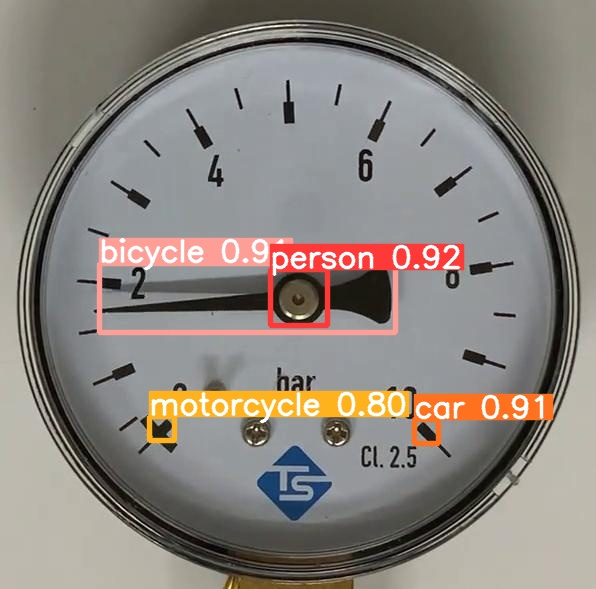

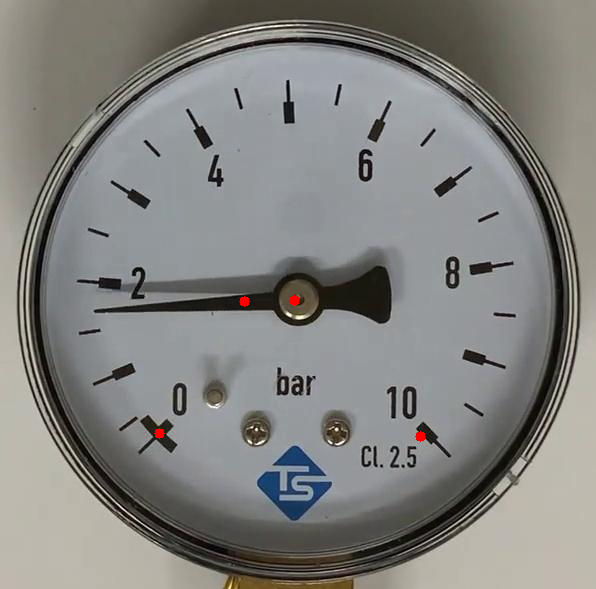

 
Successful Inference
Min angle:  52
Max angle:  46
Original Theta:  11
Pointer Position:  top_left
Adjusted Theta:  52.0
value:  11.908396946564885


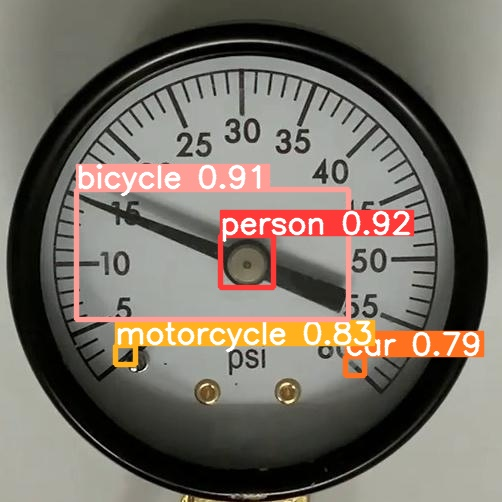

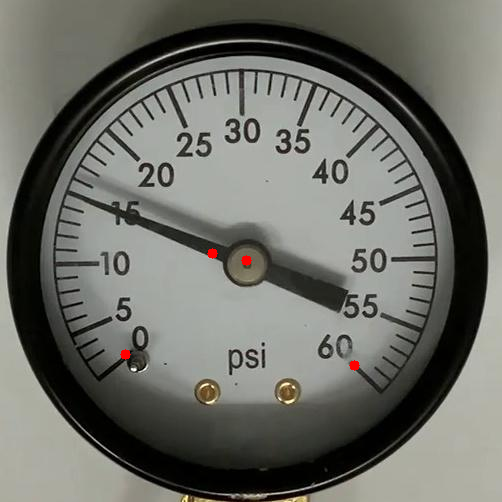

 
Successful Inference
Min angle:  53
Max angle:  46
Original Theta:  13
Pointer Position:  top_left
Adjusted Theta:  53.5
value:  12.298850574712644


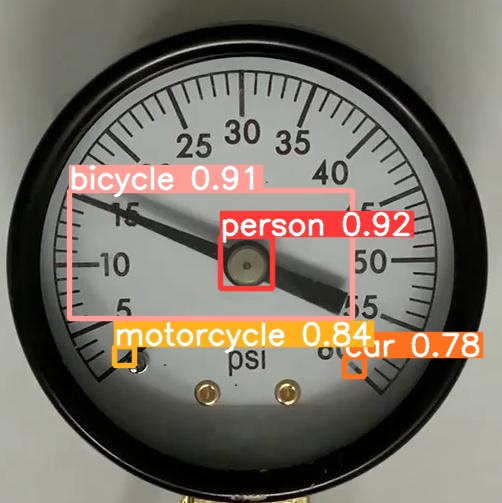

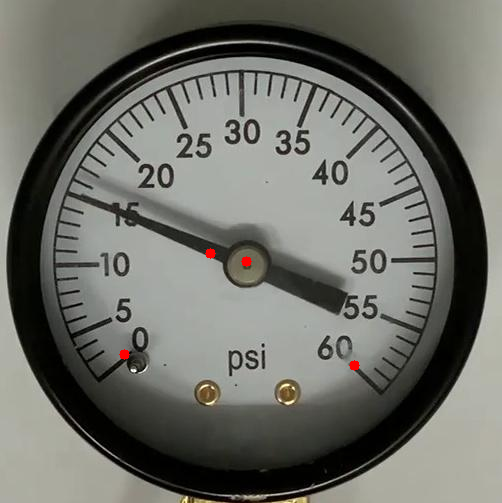

 
Successful Inference
Min angle:  46
Max angle:  44
Original Theta:  12
Pointer Position:  bottom_left
Adjusted Theta:  33.0
value:  1.222222222222222


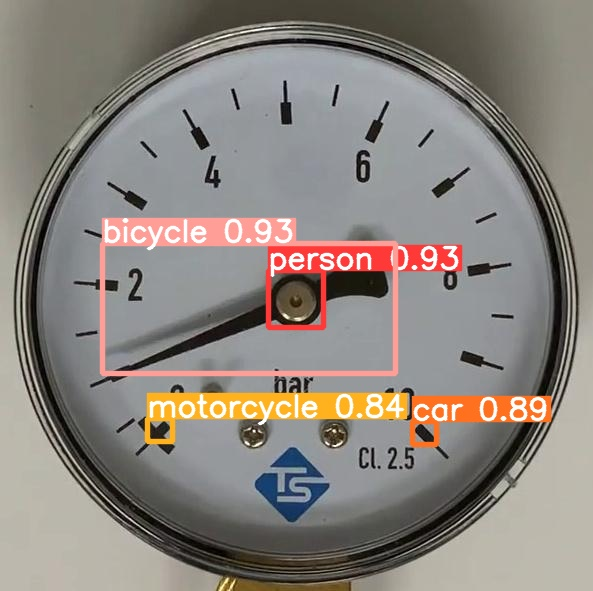

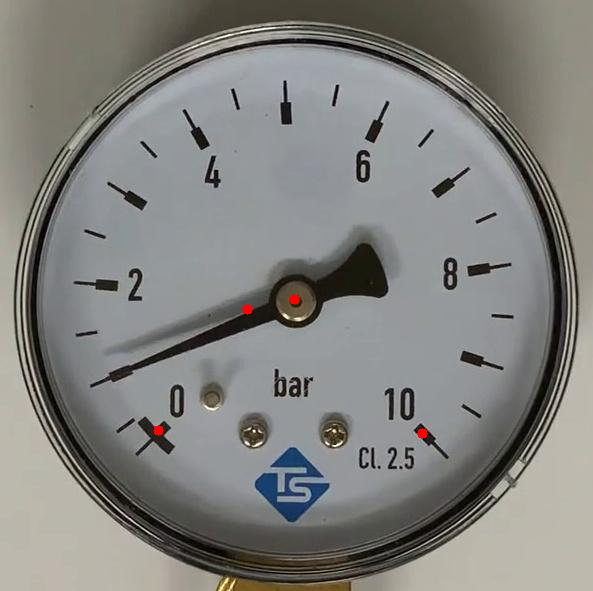

 
Successful Inference
Min angle:  52
Max angle:  45
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  40.5
value:  9.239543726235743


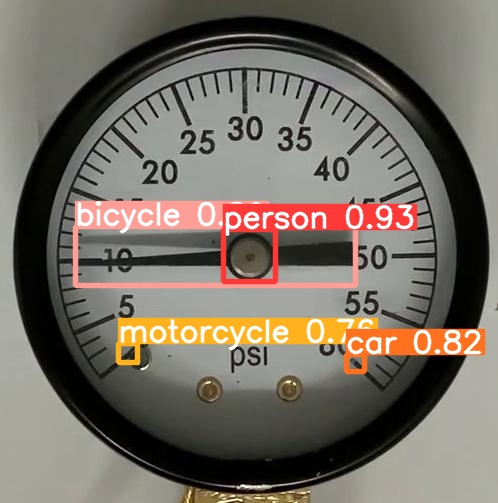

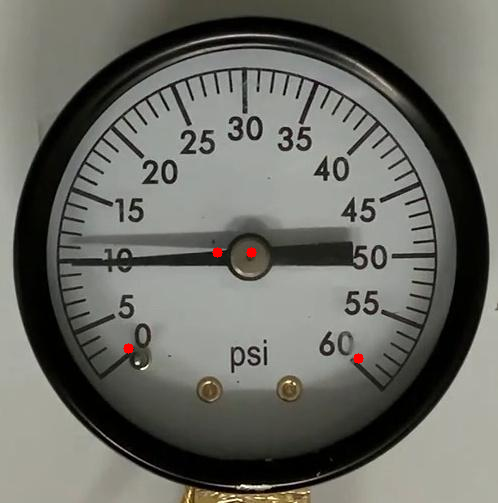

 
Successful Inference
Min angle:  51
Max angle:  45
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  41.0
value:  9.318181818181818


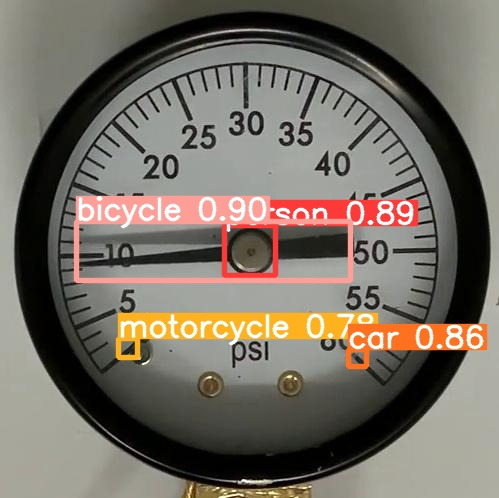

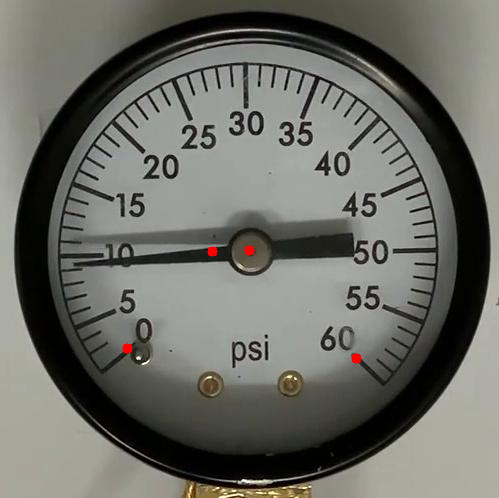

 
Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  78
Pointer Position:  top_left
Adjusted Theta:  123.5
value:  4.557195571955719


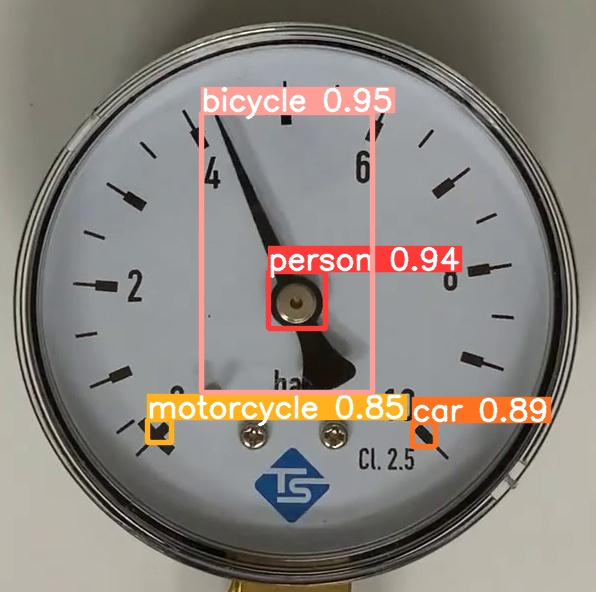

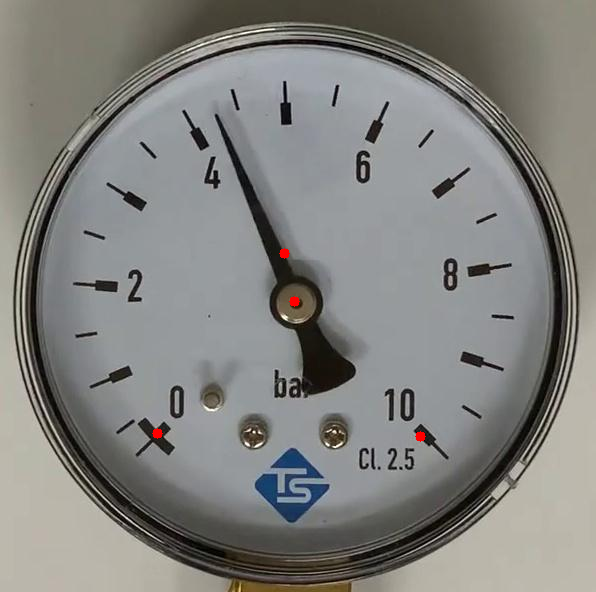

 
Successful Inference
Min angle:  45
Max angle:  42
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  45.5
value:  1.6666666666666665


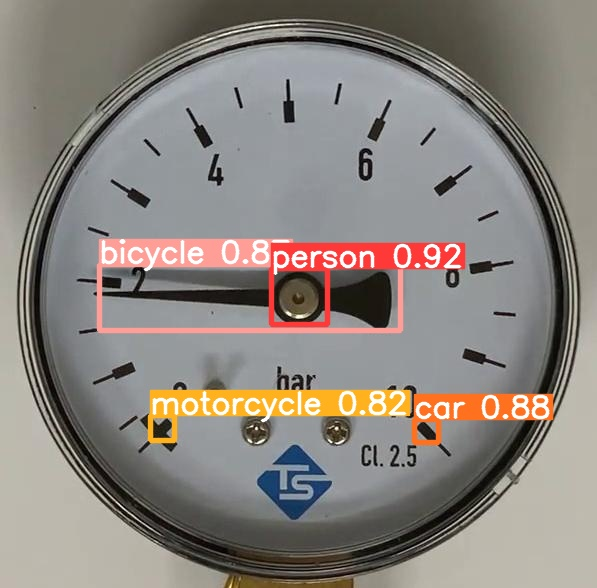

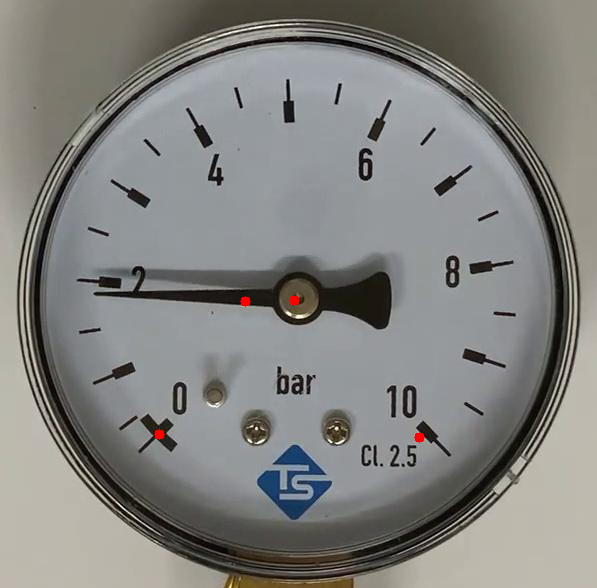

 
Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  10
Pointer Position:  top_left
Adjusted Theta:  55.5
value:  2.047970479704797


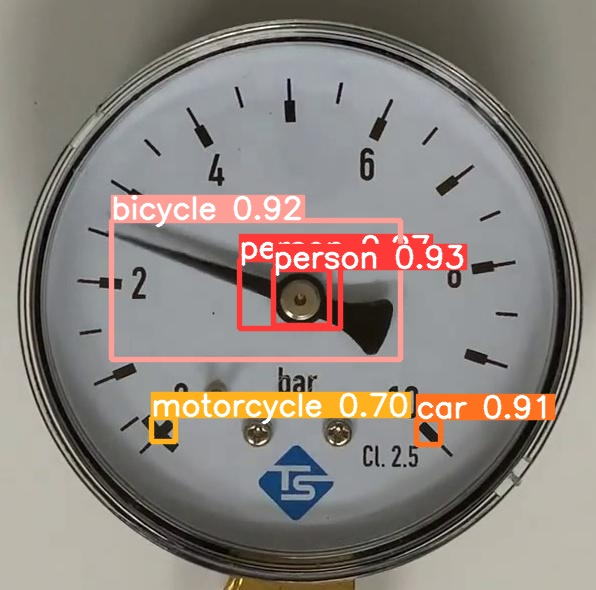

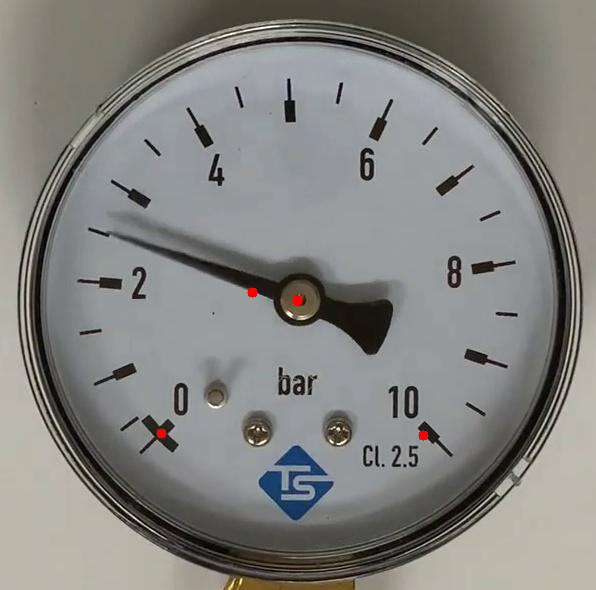

 
Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  6
Pointer Position:  top_right
Adjusted Theta:  219.5
value:  8.099630996309964


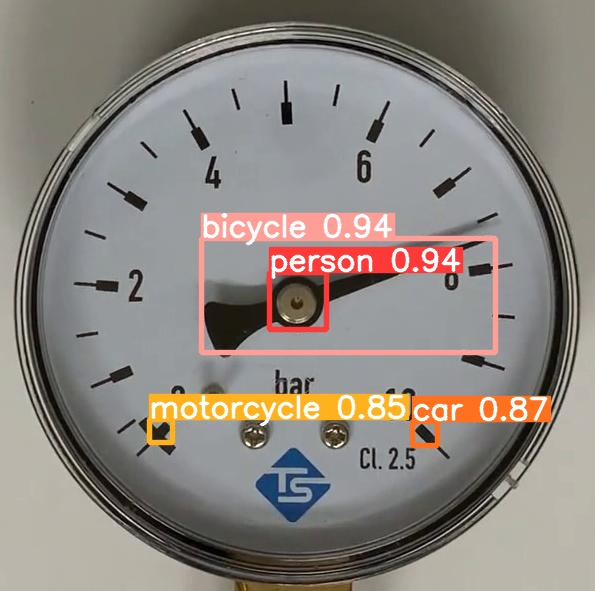

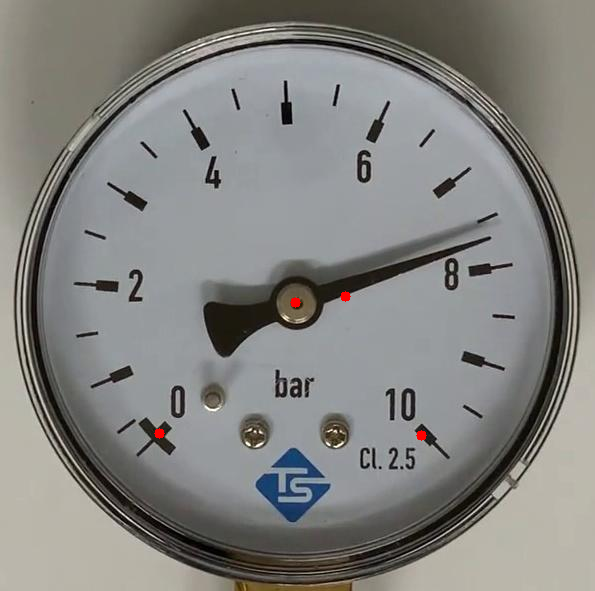

In [27]:
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow

count_fail = 0
count_success = 0 

test_images_prediction_dict = {}

for inf_image, image, txt in zip(inference_list[0:10], image_list[0:10], sort_txt_list[0:10]):

  cv2_inf_image = cv2.imread(inf_image, cv2.IMREAD_COLOR)
  my_image_path = image
  my_img = cv2.imread(my_image_path)
  my_image_x = my_img.shape[0]
  my_image_y = my_img.shape[1]

  #0 = center, 1 = tip, 2 = max, 3 = min
  with open(txt) as f:
    container = []
    for line in f.readlines():
      temp_list = []
      for index, value in enumerate(line.split()):
        if index == 0:
          temp_list.append(float(value))
        elif index == 1:
          temp_list.append(float(value)*my_image_x)
        elif index == 2:
          temp_list.append(float(value)*my_image_y)        
        elif index == 3:
          temp_list.append(float(value)*my_image_x)
        elif index == 4:
          temp_list.append(float(value)*my_image_y)
      container.append(temp_list)

  # Class mapping: 0 = center, 1 = pointer, 2 = max, 3 = min
  container3 = container[-4:]
  first_df = pd.DataFrame(container3, columns = ["class","x_center","y_center","width","height"])
  

  if len(list(first_df['class'])) == 4:
    print("Successful Inference")

    center_x = float(first_df["x_center"][first_df["class"]==0.0])
    center_y = float(first_df["y_center"][first_df["class"]==0.0])

    pointer_x = float(first_df["x_center"][first_df["class"]==1.0])
    pointer_y = float(first_df["y_center"][first_df["class"]==1.0])

    max_x = float(first_df["x_center"][first_df["class"]==2.0])
    max_y = float(first_df["y_center"][first_df["class"]==2.0])

    min_x = float(first_df["x_center"][first_df["class"]==3.0])
    min_y = float(first_df["y_center"][first_df["class"]==3.0])
    
    

    min_angle = calculate_min_center_angle(min_x, min_y, center_x, center_y)
    print("Min angle: ", min_angle)

    max_angle = calculate_max_center_angle(max_x, max_y, center_x, center_y)
    print("Max angle: ", max_angle)

    theta = calculate_theta(center_x, center_y, pointer_x, pointer_y)
    print("Original Theta: ", theta)

    position = find_position(center_x, center_y, pointer_x, pointer_y)
    print("Pointer Position: ", position)

    new_theta = adjust_theta(theta, (min_angle+max_angle)/2, position)
    print("Adjusted Theta: ", new_theta)

    meter_degree = 360 - (min_angle+max_angle)

    if "meter_a" in inf_image:
        test_value = map_theta_value(0, 10, meter_degree, new_theta)
        print("value: ",test_value)
    elif "meter_b" in inf_image:
        test_value = map_theta_value(0, 60, meter_degree, new_theta)
        print("value: ",test_value)

    cv2_imshow(cv2_inf_image)
    four_dots_on_image(center_x, center_y, pointer_x, pointer_y, min_x, min_y, max_x, max_y, my_image_path)

    test_images_prediction_dict[image[58:]] = (new_theta, test_value)   

    count_success += 1
    print(" ")

  else:
    print("Failed Inference")
    cv2_imshow(cv2_inf_image)
    count_fail += 1
    print(" ")

### Demonstrate the test images that has more than 4 bounding boxes
Some images will have this issue, but their predicted results can still be obtained by using the labels with highest confidence level.

There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid3_42_jpg.rf.2af41a6cc9f666bd33fbee6e72dc3a6d.txt


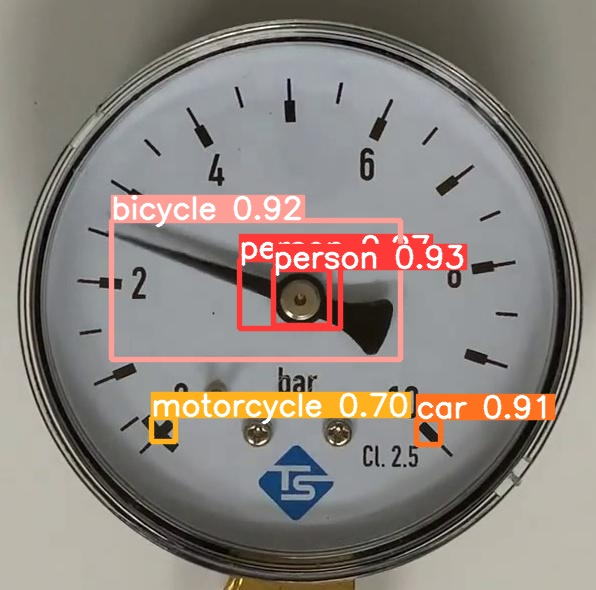

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid3_92_jpg.rf.5d3f7a3851f122374a7e53152cdcf167.txt


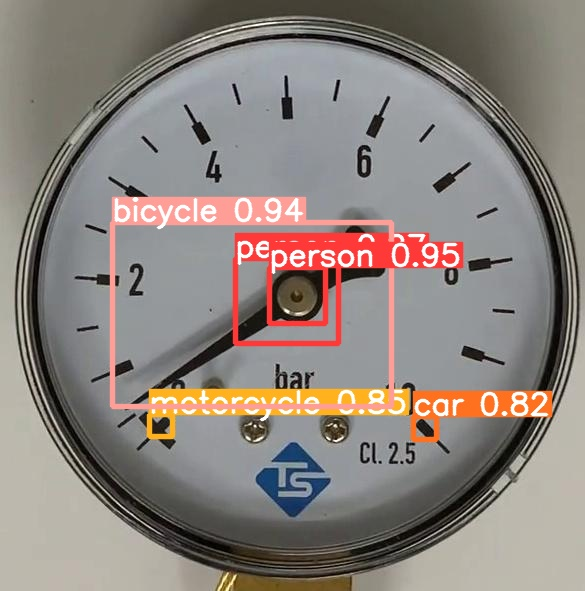

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid2_101_jpg.rf.c129718f899dd771c1461796c05c274d.txt


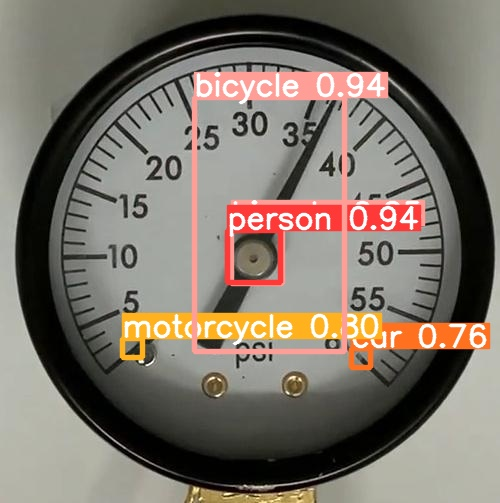

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid3_127_jpg.rf.f4995c031481c5ae8531f6b0d34885fb.txt


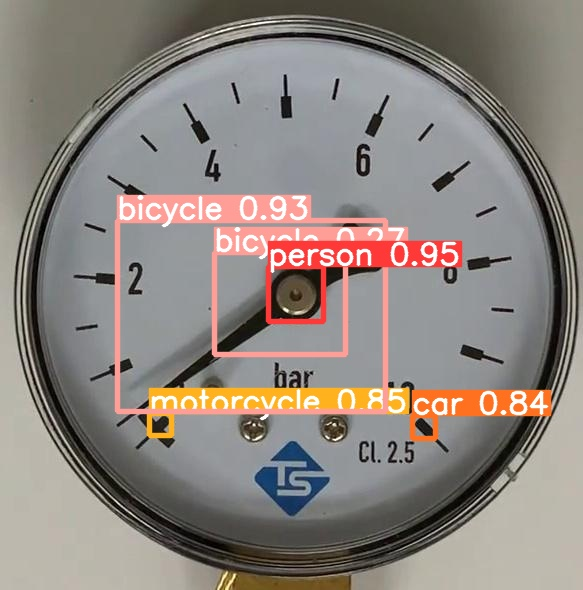

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid3_64_jpg.rf.06ebb2ea58963b6522a2cdb57cf6e608.txt


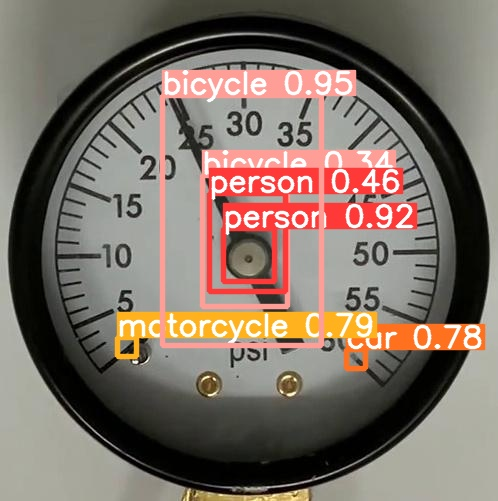

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid2_91_jpg.rf.457dd33048c499cb9a5c8b4ad05420dd.txt


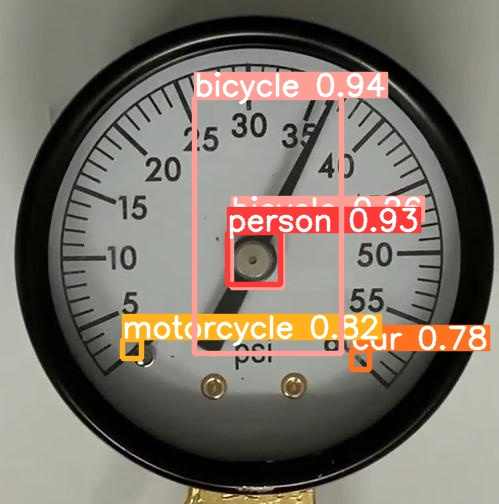

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid3_0_jpg.rf.3812fa4ebef0a09c9a95f299608322fa.txt


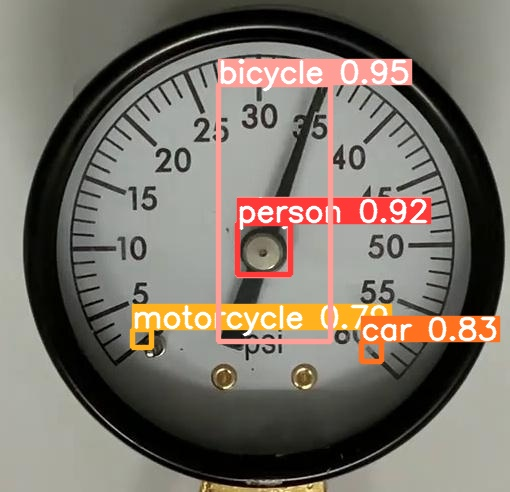

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid2_112_jpg.rf.c7c726915e53046f18abcc18adfe9335.txt


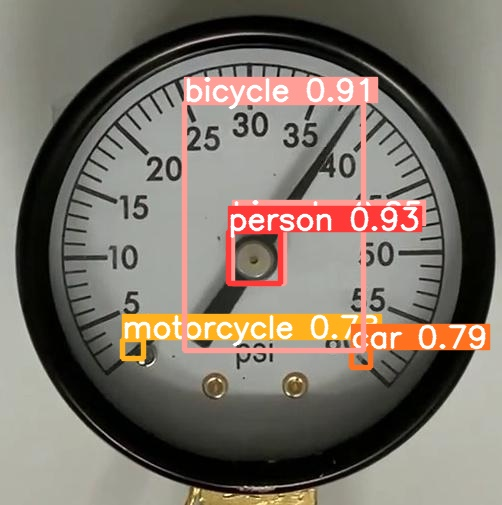

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid3_132_jpg.rf.69bde685835bc5fb8d8b4ce681b89fc2.txt


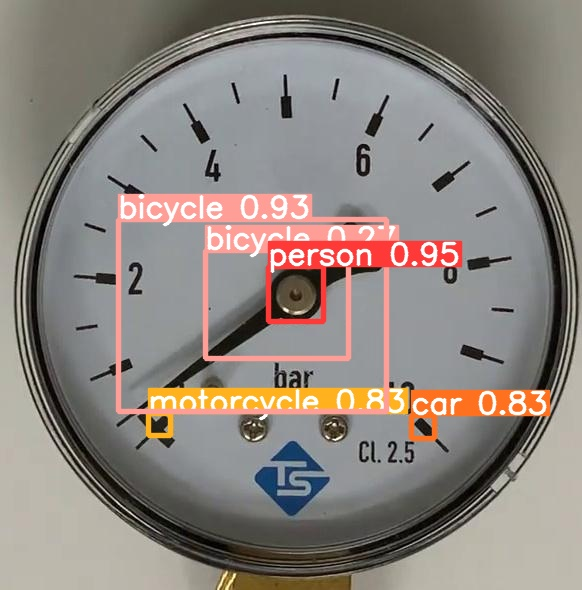

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_b_vid2_117_jpg.rf.cb6890e3cafd93285580c16d9abbedb4.txt


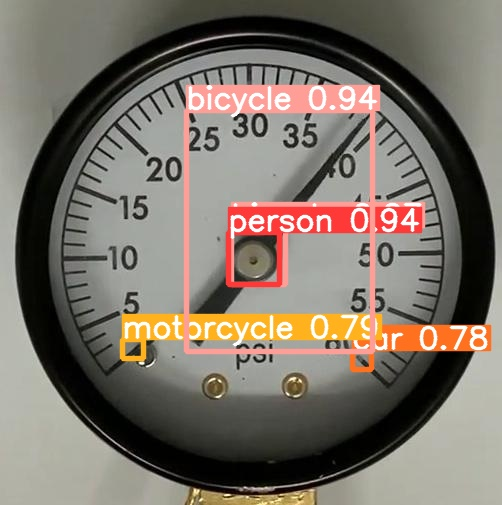

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid1_34_jpg.rf.09ddfa647b09d14fbbd6da0a9f0c5d6f.txt


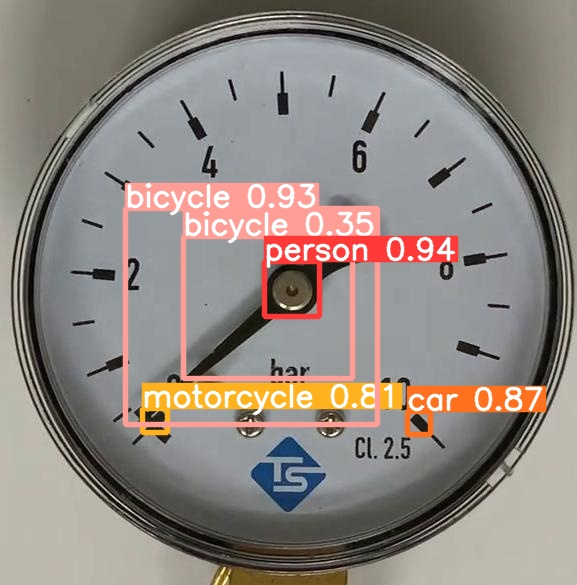

 
There are more than 4 bounding boxes
/content/yolov5/runs/detect/exp/labels/meter_a_vid3_126_jpg.rf.8d724e7faf34563f82f23d24ed2ad72d.txt


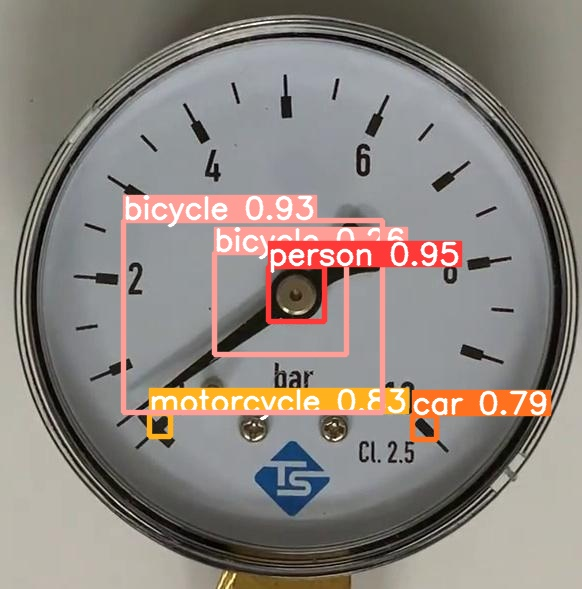

In [28]:
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow

count_fail = 0
count_success = 0

test_images_prediction_dict = {}

fail_list = []

for inf_image, image, txt in zip(inference_list, image_list, sort_txt_list):

  cv2_inf_image = cv2.imread(inf_image, cv2.IMREAD_COLOR)
  my_image_path = image
  my_img = cv2.imread(my_image_path)
  my_image_x = my_img.shape[0]
  my_image_y = my_img.shape[1]

  #0 = center, 1 = tip, 2 = max, 3 = min
  with open(txt) as f:
    container = []
    for line in f.readlines():
      temp_list = []
      for index, value in enumerate(line.split()):
        if index == 0:
          temp_list.append(float(value))
        elif index == 1:
          temp_list.append(float(value)*my_image_x)
        elif index == 2:
          temp_list.append(float(value)*my_image_y)        
        elif index == 3:
          temp_list.append(float(value)*my_image_x)
        elif index == 4:
          temp_list.append(float(value)*my_image_y)
      container.append(temp_list)

  # Class mapping: 0 = center, 1 = pointer, 2 = max, 3 = min
  first_df = pd.DataFrame(container, columns = ["class","x_center","y_center","width","height"])
  

  if len(list(first_df['class'])) != len(set(list(first_df['class']))):
    print("There are more than 4 bounding boxes")
    print(txt)

    cv2_imshow(cv2_inf_image)

    count_fail += 1
    fail_list.append((inf_image, image, txt))
    print(" ")
  else:
    #Successful Inference
    center_x = float(first_df["x_center"][first_df["class"]==0.0])
    center_y = float(first_df["y_center"][first_df["class"]==0.0])

    pointer_x = float(first_df["x_center"][first_df["class"]==1.0])
    pointer_y = float(first_df["y_center"][first_df["class"]==1.0])

    count_success += 1

### Demonstrate all predicted results on test sets
(Note: This part will not show the inference images.)

In [29]:
import pandas as pd
import cv2
from google.colab.patches import cv2_imshow

count_fail = 0
count_success = 0

test_images_prediction_dict = {}

for inf_image, image, txt in zip(inference_list, image_list, sort_txt_list):

  cv2_inf_image = cv2.imread(inf_image, cv2.IMREAD_COLOR)
  my_image_path = image
  my_img = cv2.imread(my_image_path)
  my_image_x = my_img.shape[0]
  my_image_y = my_img.shape[1]

  #0 = center, 1 = tip, 2 = max, 3 = min
  with open(txt) as f:
    container = []
    for line in f.readlines():
      temp_list = []
      for index, value in enumerate(line.split()):
        if index == 0:
          temp_list.append(float(value))
        elif index == 1:
          temp_list.append(float(value)*my_image_x)
        elif index == 2:
          temp_list.append(float(value)*my_image_y)        
        elif index == 3:
          temp_list.append(float(value)*my_image_x)
        elif index == 4:
          temp_list.append(float(value)*my_image_y)
      container.append(temp_list)

  #print(container)

  # Class mapping: 0 = center, 1 = pointer, 2 = max, 3 = min
  container3 = container[-4:]
  first_df = pd.DataFrame(container3, columns = ["class","x_center","y_center","width","height"])
  

  if len(list(first_df['class'])) == 4:
    print("Successful Inference")

    center_x = float(first_df["x_center"][first_df["class"]==0.0])
    center_y = float(first_df["y_center"][first_df["class"]==0.0])

    pointer_x = float(first_df["x_center"][first_df["class"]==1.0])
    pointer_y = float(first_df["y_center"][first_df["class"]==1.0])

    max_x = float(first_df["x_center"][first_df["class"]==2.0])
    max_y = float(first_df["y_center"][first_df["class"]==2.0])

    min_x = float(first_df["x_center"][first_df["class"]==3.0])
    min_y = float(first_df["y_center"][first_df["class"]==3.0])
    
    #cv2_imshow(cv2_inf_image)

    min_angle = calculate_min_center_angle(min_x, min_y, center_x, center_y)
    print("Min angle: ", min_angle)

    max_angle = calculate_max_center_angle(max_x, max_y, center_x, center_y)
    print("Max angle: ", max_angle)

    theta = calculate_theta(center_x, center_y, pointer_x, pointer_y)
    print("Original Theta: ", theta)

    position = find_position(center_x, center_y, pointer_x, pointer_y)
    print("Pointer Position: ", position)

    new_theta = adjust_theta(theta, (min_angle+max_angle)/2, position)
    print("Adjusted Theta: ", new_theta)

    meter_degree = 360 - (min_angle+max_angle)

    if "meter_a" in inf_image:
        test_value = map_theta_value(0, 10, meter_degree, new_theta)
        print("value: ",test_value)
    elif "meter_b" in inf_image:
        test_value = map_theta_value(0, 60, meter_degree, new_theta)
        print("value: ",test_value)

    #four_dots_on_image(center_x, center_y, pointer_x, pointer_y, min_x, min_y, max_x, max_y, my_image_path)

    test_images_prediction_dict[image[58:]] = (new_theta, test_value)   

    count_success += 1
    print(" ")

  else:
    print("Failed Inference")

    cv2_imshow(cv2_inf_image)
    count_fail += 1
    print(" ")

Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  44.5
value:  1.6420664206642066
 
Successful Inference
Min angle:  52
Max angle:  46
Original Theta:  11
Pointer Position:  top_left
Adjusted Theta:  52.0
value:  11.908396946564885
 
Successful Inference
Min angle:  53
Max angle:  46
Original Theta:  13
Pointer Position:  top_left
Adjusted Theta:  53.5
value:  12.298850574712644
 
Successful Inference
Min angle:  46
Max angle:  44
Original Theta:  12
Pointer Position:  bottom_left
Adjusted Theta:  33.0
value:  1.222222222222222
 
Successful Inference
Min angle:  52
Max angle:  45
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  40.5
value:  9.239543726235743
 
Successful Inference
Min angle:  51
Max angle:  45
Original Theta:  1
Pointer Position:  bottom_left
Adjusted Theta:  41.0
value:  9.318181818181818
 
Successful Inference
Min angle:  46
Max angle:  43
Original Theta:  78
Pointer Position:  top_

### This shows that all test images are successfully inferenced.

In [30]:
print("How many test images successfully provided predicted results: ",count_success)
print("How many test images failed to provided predicted results: ",count_fail)

How many test images successfully provided predicted results:  90
How many test images failed to provided predicted results:  0


# [Skipping Instructions] Preparing the datasets for performance evaluation

If you want to skip the data preparation process, follow these instructions:
1.   make directories --> /content/yolov5/evaluation/howells_prediction
2.   copy Howells' json files into the **howells_prediction** folder
3.   copy **true_labels.xlsx** into the **evaluation** folder
4.   copy other models' excel filtes into **evaluation** folder

Here are Howells' json files:
*   meter_a_vid1_gt.json
*   meter_a_vid2_gt.json
*   meter_a_vid3_gt.json
*   meter_b_vid1_gt.json
*   meter_b_vid2_gt.json
*   meter_b_vid3_gt.json

Here are other models' excel files:
*   howells_prediction.excel
*   quantization_dynamic.excel
*   quantization_float16.excel
*   quantization_16x8.excel

Please run the cell below


In [31]:
!mkdir -p /content/yolov5/evaluation/howells_prediction
!cp -r /content/wei_jie_wang_bachelor_project/howells_prediction/. /content/yolov5/evaluation/howells_prediction
!cp -r /content/wei_jie_wang_bachelor_project/true_labels_and_prediction_results/. /content/yolov5/evaluation

# Preparing the datasets for performance evaluation

Follow these instructions:
1.   make directories --> /content/yolov5/evaluation/howells_prediction
2.   manually put Howells' json files into the **howells_prediction** folder
3.   manually put **true_labels.xlsx** into the **evaluation** folder

Here are Howells' json files:
*   meter_a_vid1_gt.json
*   meter_a_vid2_gt.json
*   meter_a_vid3_gt.json
*   meter_b_vid1_gt.json
*   meter_b_vid2_gt.json
*   meter_b_vid3_gt.json


In [32]:
!mkdir -p /content/yolov5/evaluation/howells_prediction
!cp -r /content/wei_jie_wang_bachelor_project/howells_prediction/. /content/yolov5/evaluation/howells_prediction
!cp -r /content/wei_jie_wang_bachelor_project/true_labels_and_prediction_results/true_labels.xlsx /content/yolov5/evaluation

In [33]:
df = pd.read_excel("/content/yolov5/evaluation/true_labels.xlsx")
df

,image_name,dataset_name,frame,true_angle,true_value
0,meter_b_vid3_34_jpg.rf.bb95eabe46cb033d9bb64bb...,meter_b_vid3,34,115.0,27.8
1,meter_a_vid3_27_jpg.rf.adb56d35c777c3dcce25c5c...,meter_a_vid3,27,92.0,3.7
2,meter_b_vid2_29_jpg.rf.0672222a4952863ae3ed38a...,meter_b_vid2,29,129.0,30.8
3,meter_a_vid2_57_jpg.rf.e3d456f4c901226e0bf275a...,meter_a_vid2,57,208.0,7.8
4,meter_b_vid2_61_jpg.rf.70df43ed09b4edf4447b180...,meter_b_vid2,61,129.0,30.8
...,...,...,...,...,...
85,meter_b_vid2_101_jpg.rf.c129718f899dd771c14617...,meter_b_vid2,101,153.5,36.4
86,meter_b_vid3_127_jpg.rf.62be62736f9233d01c4a79...,meter_b_vid3,127,63.5,15.7
87,meter_b_vid3_70_jpg.rf.ca3455707c4d9db70df9d2f...,meter_b_vid3,70,90.5,22.1
88,meter_b_vid3_130_jpg.rf.1ff933231f0d2369765c21...,meter_b_vid3,130,62.0,15.5


In [34]:
name_list = list(df["image_name"])

pred_angle_list = []
pred_value_list = []

for name in name_list:
  pred_angle_list.append(test_images_prediction_dict[name][0])
  pred_value_list.append(test_images_prediction_dict[name][1])

In [35]:
df_with_prediction = df.copy()
df_with_prediction["pred_angle"] = pred_angle_list
df_with_prediction["pred_value"] = pred_value_list
df_with_prediction

,image_name,dataset_name,frame,true_angle,true_value,pred_angle,pred_value
0,meter_b_vid3_34_jpg.rf.bb95eabe46cb033d9bb64bb...,meter_b_vid3,34,115.0,27.8,132.0,30.229008
1,meter_a_vid3_27_jpg.rf.adb56d35c777c3dcce25c5c...,meter_a_vid3,27,92.0,3.7,101.5,3.745387
2,meter_b_vid2_29_jpg.rf.0672222a4952863ae3ed38a...,meter_b_vid2,29,129.0,30.8,130.0,30.232558
3,meter_a_vid2_57_jpg.rf.e3d456f4c901226e0bf275a...,meter_a_vid2,57,208.0,7.8,221.5,8.173432
4,meter_b_vid2_61_jpg.rf.70df43ed09b4edf4447b180...,meter_b_vid2,61,129.0,30.8,131.5,30.463320
...,...,...,...,...,...,...,...
85,meter_b_vid2_101_jpg.rf.c129718f899dd771c14617...,meter_b_vid2,101,153.5,36.4,156.0,36.000000
86,meter_b_vid3_127_jpg.rf.62be62736f9233d01c4a79...,meter_b_vid3,127,63.5,15.7,57.0,13.053435
87,meter_b_vid3_70_jpg.rf.ca3455707c4d9db70df9d2f...,meter_b_vid3,70,90.5,22.1,101.0,23.129771
88,meter_b_vid3_130_jpg.rf.1ff933231f0d2369765c21...,meter_b_vid3,130,62.0,15.5,55.5,12.758621


In [36]:
df_with_prediction.to_excel("/content/yolov5/evaluation/quantization_dynamic.xlsx", index = False)

The current **test_images_prediction_dict** is containing the predicted results from **quantization_dynamic.tflite**, therefore the **df_with_prediction** is for dymiction quantized model.

If you want to output other models' prediction redults, follow these instructions:
1.   Go back to **Sort the predicted images, predicted txt files, orginal images**
2.   Find all the lines that contains **/content/yolov5/runs/detect/exp**
3.   Change **exp** into **exp1** or **exp2**
4.   Run all the cells in **Sort the predicted images, predicted txt files, orginal images** section
5.   Go to **Demonstrate all predicted results on thest sets** and run the cell
6.   Come back to **Preparing the datasets for performance evaluation** and run all the cells in the section 

Note: remember to change the name of the file to **quantization_float16.xlsx** or **quantization_16x8.xlsx**

#### The code below are for organizing a xlsx file for Howells' predicted results

In [37]:
import json
from os import listdir
from os.path import isfile, join
all_angle_list = listdir("/content/yolov5/evaluation/howells_prediction")
all_angle_list

['meter_a_vid2_gt.json',
 'meter_a_vid3_gt.json',
 'meter_a_vid1_gt.json',
 'meter_b_vid2_gt.json',
 'meter_b_vid3_gt.json',
 'meter_b_vid1_gt.json']

In [38]:
all_angle_dic = {}
for angle_name in all_angle_list:
    f = open('/content/yolov5/evaluation/howells_prediction/{}'.format(angle_name))
    data = json.load(f)
    all_angle_dic[angle_name[0:12]]=data['angles']

In [39]:
all_value_dic = {}
for angle_name in all_angle_list:
    f = open('/content/yolov5/evaluation/howells_prediction/{}'.format(angle_name))
    data = json.load(f)
    all_value_dic[angle_name[0:12]]=data['values']

In [40]:
angle_list = []
value_list = []

for image in list(df['image_name']):
    if image == '.DS_Store':
        continue
    else:
        image_split = image.split("_")
        dataset_name = image_split[0]+"_"+image_split[1]+"_"+image_split[2]
        frame = image_split[3]

        angle_list.append(all_angle_dic[dataset_name][int(frame)])
        value_list.append(all_value_dic[dataset_name][int(frame)])

In [41]:
df_howells = df.copy()
df_howells["pred_angle"] = angle_list
df_howells["pred_value"] = value_list
df_howells

,image_name,dataset_name,frame,true_angle,true_value,pred_angle,pred_value
0,meter_b_vid3_34_jpg.rf.bb95eabe46cb033d9bb64bb...,meter_b_vid3,34,115.0,27.8,115.65,27.81
1,meter_a_vid3_27_jpg.rf.adb56d35c777c3dcce25c5c...,meter_a_vid3,27,92.0,3.7,93.39,3.61
2,meter_b_vid2_29_jpg.rf.0672222a4952863ae3ed38a...,meter_b_vid2,29,129.0,30.8,128.59,30.73
3,meter_a_vid2_57_jpg.rf.e3d456f4c901226e0bf275a...,meter_a_vid2,57,208.0,7.8,166.78,7.78
4,meter_b_vid2_61_jpg.rf.70df43ed09b4edf4447b180...,meter_b_vid2,61,129.0,30.8,128.59,30.73
...,...,...,...,...,...,...,...
85,meter_b_vid2_101_jpg.rf.c129718f899dd771c14617...,meter_b_vid2,101,153.5,36.4,153.78,36.35
86,meter_b_vid3_127_jpg.rf.62be62736f9233d01c4a79...,meter_b_vid3,127,63.5,15.7,65.07,16.52
87,meter_b_vid3_70_jpg.rf.ca3455707c4d9db70df9d2f...,meter_b_vid3,70,90.5,22.1,92.07,22.54
88,meter_b_vid3_130_jpg.rf.1ff933231f0d2369765c21...,meter_b_vid3,130,62.0,15.5,63.61,16.19


In [42]:
df_howells.to_excel("/content/yolov5/evaluation/howells_prediction.xlsx", index = False)

# Compare Results Between Different Prediction

### Load the predicted values

In [43]:
howells_prediction = pd.read_excel("/content/yolov5/evaluation/howells_prediction.xlsx")
quantization_dynamic = pd.read_excel("/content/yolov5/evaluation/quantization_dynamic.xlsx")
quantization_float16 = pd.read_excel("/content/yolov5/evaluation/quantization_float16.xlsx")
quantization_16x8 = pd.read_excel("/content/yolov5/evaluation/quantization_16x8.xlsx")

### Calculate the absolute difference between true values and predicted values

In [44]:
howells_prediction['delta_angle'] = (howells_prediction['true_angle'] - howells_prediction['pred_angle']).abs()
howells_prediction['delta_value'] = (howells_prediction['true_value'] - howells_prediction['pred_value']).abs()

quantization_dynamic['delta_angle'] = (quantization_dynamic['true_angle'] - quantization_dynamic['pred_angle']).abs()
quantization_dynamic['delta_value'] = (quantization_dynamic['true_value'] - quantization_dynamic['pred_value']).abs()

quantization_float16['delta_angle'] = (quantization_float16['true_angle'] - quantization_float16['pred_angle']).abs()
quantization_float16['delta_value'] = (quantization_float16['true_value'] - quantization_float16['pred_value']).abs()

quantization_16x8['delta_angle'] = (quantization_16x8['true_angle'] - quantization_16x8['pred_angle']).abs()
quantization_16x8['delta_value'] = (quantization_16x8['true_value'] - quantization_16x8['pred_value']).abs()

### Make a function that calculates the metrics

In [45]:
def calculate_metrics(df):
    df_a = df[df['image_name'].str.contains('meter_a')]

    meter_a_average_delta_angle = df_a['delta_angle'].mean()
    meter_a_max_delta_angle = df_a['delta_angle'].max()

    meter_a_average_delta_value = df_a['delta_value'].mean()
    meter_a_max_delta_value = df_a['delta_value'].max()

    print("Meter: A")
    print("")
    print('average_delta_angle: ', meter_a_average_delta_angle)
    print('max_delta_angle: ', meter_a_max_delta_angle)
    print("")
    print('average_delta_value: ',meter_a_average_delta_value)
    print('max_delta_value: ',meter_a_max_delta_value)
    print("")

    df_b = df[df['image_name'].str.contains('meter_b')]

    meter_b_average_delta_angle = df_b['delta_angle'].mean()
    meter_b_max_delta_angle = df_b['delta_angle'].max()

    meter_b_average_delta_value = df_b['delta_value'].mean()
    meter_b_max_delta_value = df_b['delta_value'].max()

    print("Meter: B")
    print("")
    print('average_delta_angle: ', meter_b_average_delta_angle)
    print('max_delta_angle: ', meter_b_max_delta_angle)
    print("")
    print('average_delta_value: ',meter_b_average_delta_value)
    print('max_delta_value: ',meter_b_max_delta_value)
    print("")

In [46]:
calculate_metrics(howells_prediction)

Meter: A

average_delta_angle:  11.40422222222222
max_delta_angle:  42.150000000000006

average_delta_value:  0.1624444444444445
max_delta_value:  0.75

Meter: B

average_delta_angle:  0.9935555555555559
max_delta_angle:  6.900000000000006

average_delta_value:  0.38577777777777755
max_delta_value:  1.6599999999999966



In [47]:
calculate_metrics(quantization_dynamic)

Meter: A

average_delta_angle:  8.277777777777779
max_delta_angle:  16.5

average_delta_value:  0.26185282707598584
max_delta_value:  0.5841328413284128

Meter: B

average_delta_angle:  6.811111111111111
max_delta_angle:  18.5

average_delta_value:  1.4381439742483981
max_delta_value:  3.0916030534351204



In [48]:
calculate_metrics(quantization_float16)

Meter: A

average_delta_angle:  8.511111111111111
max_delta_angle:  16.5

average_delta_value:  0.27081615350780947
max_delta_value:  0.6472324723247229

Meter: B

average_delta_angle:  6.9
max_delta_angle:  19.0

average_delta_value:  1.4372227414138694
max_delta_value:  3.160919540229891



In [49]:
calculate_metrics(quantization_16x8)

Meter: A

average_delta_angle:  8.455555555555556
max_delta_angle:  16.5

average_delta_value:  0.26901206612875167
max_delta_value:  0.6103321033210329

Meter: B

average_delta_angle:  6.777777777777778
max_delta_angle:  18.5

average_delta_value:  1.4485419764524972
max_delta_value:  3.1310344827586185

